# Sexing threespine stickleback using chromosome-wide coverage

Here we investigate how to sex samples based on chromosome wide coverages from samtools. Ultimately I want a simple python script that can do this as part of the data processing pipline for the FITNESS project. However I first want to check how obvious and consistent the threshold for separating males and females is.

(Note I have done this previously with samples for which we knew the sex, and it is perfectly viable as an approach. The question is where do we put the cut-offs). I especially want to know how certain we can be in situations where the overall coverage for a sample is bad). 



In [13]:

def find_files(indir, suffix):
    
    """
    This function will find all files in a folder with a given suffix.

    """

    import os  
    
    file_list = []

    for file in os.listdir(indir):
        if file.endswith(suffix):
            file_list.append("%s/%s" % (indir,file))
            
    return file_list



In [83]:
print(find_files.__doc__)


    This function will find all files in a folder with a given suffix.

    


In [78]:
### Ok, so for a single file, we need to get autosomal coverage, and then compare to the sex chromosome. 

def compare_covs(covfile, 
                 autosomes = ["chrI","chrII","chrIII","chrIV","chrIX","chrV","chrVI","chrVIII","chrVII","chrXI","chrXII","chrXIII","chrXIV","chrX","chrXVI","chrXVIII","chrXVII","chrXV","chrXX","chrXXI"],
                 sex_chromosomes = ["chrXIX"],
                 female_lower = 0.9, 
                 female_upper = 1.1, 
                 male_lower = 0.5,
                 male_upper = 0.6):
    
    """
    This function takes a single coverage file, and divides the average X coverage by the average autosomal coverage. 
    It outputs a file with all data, as well as an automatic classification of XX, XY, or ambiguous. 
    It also produces a pdf with a histogram of X/Autosome coverage ratios for the files processed.
    
    """
    
    
    import numpy as np
    
    autocovs = []
    sexchromcovs = []
    
    sample_name = covfile.rpartition("/")[2].split(".")[0]

    with open(results, 'w') as results_handle:
        
        results_handle.write("SAMPLE\tmean_AUTO\tstdv_AUTO\tmean_SEXCHR\tRATIO\tRESULT\n")
        
        with open(covfile) as covhandle:

            headers = next(covhandle)

            for line in covhandle:

                if line.startswith("chr"):

                    chrom = line.split()[0]
                    cov = float(line.split()[6])

                    if chrom in autosomes:
                        autocovs.append(cov)

                    elif chrom in sex_chromosomes:
                        sexchromcovs.append(cov)

            ## get averages

            autoavg = np.round(np.mean(autocovs),2)
            autostdv = np.round(np.std(autocovs),2)
            sexchromavg = np.round(np.mean(sexchromcovs),2)

            ## check sex chrom against autosomes



            ratio = np.round(sexchromavg/autoavg,2)

            if female_lower <= ratio <= female_upper:
                result = "XX"

            elif male_lower <= ratio < male_upper:
                result = "XY" 

            else: 
                result = "ambiguous"
            
        
        results_handle.write("%s\t%s\t%s\t%s\t%s\t%s" % (sample_name, autoavg, autostdv, sexchromavg, ratio, result))
        
    
    return autoavg, autostdv, sexchromavg, ratio, result
        



In [74]:
def plot_cov_ratios(cov_dict, 
                    female_lower = 0.9, 
                    female_upper = 1.1, 
                    male_lower = 0.5,
                    male_upper = 0.6):

    from matplotlib import pyplot as plt

    ratios = []

    for sample in cov_dict:

        ratios.append(cov_dict[sample]["ratio"])

    plt.figure(figsize = (10,5))
    hist = plt.hist(ratios, bins = 100, color = "black")

    ## 2n cutoffs
    plt.hlines(0-(max(hist[0]*0.9)*0.02), 0.95, 1.05, linestyle = "-", color = "darkred")
    plt.text(1, 0-(max(hist[0]*0.9)*0.2), "Female range", ha = "center", color = "darkred")

    ## 1n cutoffs
    plt.hlines(0-(max(hist[0]*0.9)*0.02), 0.5, 0.65, linestyle = "-", color = "darkblue")
    plt.text(0.575, 0-(max(hist[0]*0.9)*0.2), "Male range", ha = "center", color = "darkblue")

    ## N samples
    plt.text(0,max(hist[0]*0.9), "%s samples" % len(cov_dict))

    plt.title("X / Autosomal coverage per sample")
    plt.ylabel("N samples")

    plt.show()
    

In [80]:
import sys

sys.argv

['/Users/dj20y461/anaconda3/lib/python3.9/site-packages/ipykernel_launcher.py',
 '-f',
 '/Users/dj20y461/Library/Jupyter/runtime/kernel-76d7d6aa-3be0-4c7d-9470-7a5df3b6be7e.json']

SAMPLE	mean_AUTO	stdv_AUTO	mean_SEXCHR	RATIO	RESULT

TL_LL_19T_093	18.87	0.44	10.59	0.56	XY
FG_LL_19T_220	13.17	0.26	13.06	0.99	XX
LG_LO_19T_249	21.62	0.45	12.14	0.56	XY
SL_HL_19T_276	26.44	0.54	14.89	0.56	XY
WT_GL_19T_019	13.38	0.21	13.14	0.98	XX
WT_LL_19T_045	23.84	0.43	23.47	0.98	XX
SL_CL_19T_202	9.99	0.2	5.61	0.56	XY
WK_RL_19T_012	24.09	0.54	23.83	0.99	XX
FG_GL_19T_081	0.05	0.0	0.05	1.0	XX
FG_GL_19T_095	15.8	0.34	15.61	0.99	XX
WT_GL_19T_031	17.11	0.34	16.85	0.98	XX
SR_HL_19T_427	17.97	0.37	10.24	0.57	XY
WB_CC_19T_032	21.99	0.45	21.74	0.99	XX
WB_CC_19T_026	19.8	0.42	19.58	0.99	XX
SR_FL_19T_064	15.12	0.28	8.58	0.57	XY
SL_CL_19T_389	17.22	0.38	17.01	0.99	XX
LG_HL_19T_391	0.1	0.0	0.08	0.8	ambiguous
FG_GL_19T_122	11.73	0.27	11.62	0.99	XX
SL_CL_19T_174	7.05	0.15	3.97	0.56	XY
TL_LL_19T_118	11.21	0.24	6.3	0.56	XY
WK_HL_19T_143	8.9	0.2	8.78	0.99	XX
FG_GL_19T_123	11.46	0.25	6.46	0.56	XY
SR_RL_19T_006	25.0	0.51	14.1	0.56	XY
SL_RL_19T_119	19.71	0.41	11.02	0.56	XY
SL_RL_19T_131	12.84	0.26	12.64

/var/folders/4s/2dr1mnzx4_x3lb4mtkpcczgr0000gn/T/ipykernel_2447/2602948827.py:46: RuntimeWarning: invalid value encountered in double_scalars
  ratio = np.round(sexchromavg/autoavg,2)


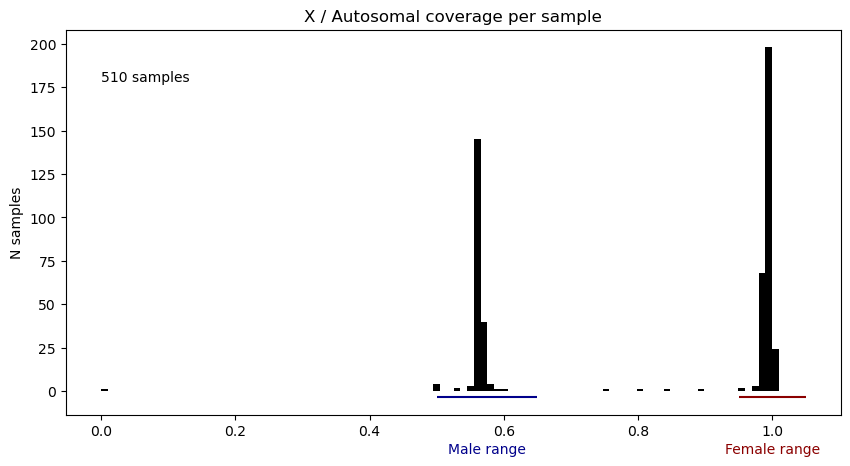

In [77]:
FEM_lower = 0.9
FEM_upper = 1.1
MALE_lower = 0.5
MALE_upper = 0.6

covfiles = find_files("/Users/dj20y461/Data_temp/Stickleback/coverage_script/samtools_coverage", "cov")

cov_dict = {}


for file in covfiles:
    
    sample_name = file.rpartition("/")[2].split(".")[0]

    cov_dict[sample_name] = {}
    
    cov_dict[sample_name]["autoavg"], cov_dict[sample_name]["autostdv"], cov_dict[sample_name]["sexchromavg"], cov_dict[sample_name]["ratio"], cov_dict[sample_name]["result"] = compare_covs(file, female_lower = FEM_lower,female_upper = FEM_upper, male_lower = MALE_lower,male_upper = MALE_upper)

plot_cov_ratios(cov_dict,
                female_lower = FEM_lower,
                female_upper = FEM_upper, 
                male_lower = MALE_lower,
                male_upper = MALE_upper)


In [61]:
max(hist[0]*0.9)

178.20000000000002

In [75]:
for sample in cov_dict:
    
    if 0.7 < cov_dict[sample]["ratio"] < 0.9:
        print(sample)
        print(cov_dict[sample])

LG_HL_19T_391
{'autoavg': 0.1, 'autostdv': 0.0, 'sexchromavg': 0.08, 'ratio': 0.8}
LG_CL_19T_392
{'autoavg': 25.18, 'autostdv': 0.55, 'sexchromavg': 22.49, 'ratio': 0.89}
WB_LO_19T_176
{'autoavg': 1.86, 'autostdv': 0.05, 'sexchromavg': 1.39, 'ratio': 0.75}
WK_RL_19T_074
{'autoavg': 20.14, 'autostdv': 0.43, 'sexchromavg': 16.84, 'ratio': 0.84}


Ok, so the separation, as expected, is extremely clean. There are some samples with intermediate ratios, but they tend to be low coverage. 

So I will just use the thresholds 0.5-0.6 for males and > 0.9 for females. Anything that is outside of that can be kept as a warning for review.

***NOTE**
There are two interesting samples, with good coverages, but SexCHR/AUTO ratios lower than expected (around 0.85). 

Disregarding the low coverage samples, these two are such outliers in an anotherwise immaculate dataset. This suggests to me that something must be going on there. . . . 
I will keep an eye on this for the next few batches, and if there are more, I will investigate further. I can't think of anything off the top of my head that would cause this. . . . perhaps other than X/Y recombination. 

## Investigating weird samples
Ok lets do it. . . . what is coverage doing on the sex chromosome in this species? 

In [3]:
with open("/Users/dj20y461/Data_temp/Stickleback/coverage_script/LG_CL_19T_392.1000bp.RPKM.depth") as LG_CL_392:
    
    chrom_cov_dict = {}
    
    for line in LG_CL_392:
        chrom = line.split()[0]
        start = int(line.split()[1])
        RPKM = float(line.split()[3])
        
        if chrom not in chrom_cov_dict:
            chrom_cov_dict[chrom] = {}
            chrom_cov_dict[chrom]["start"] = []
            chrom_cov_dict[chrom]["RPKM"] = []
            
        chrom_cov_dict[chrom]["start"].append(start)
        chrom_cov_dict[chrom]["RPKM"].append(RPKM)
        

chrI


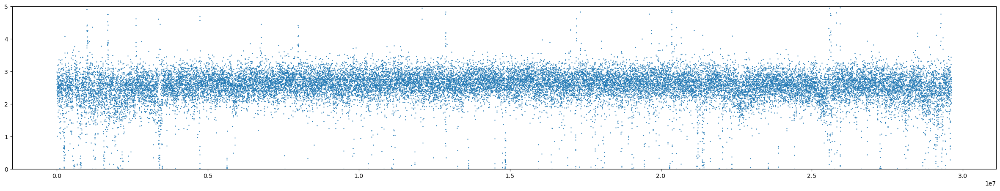

chrII


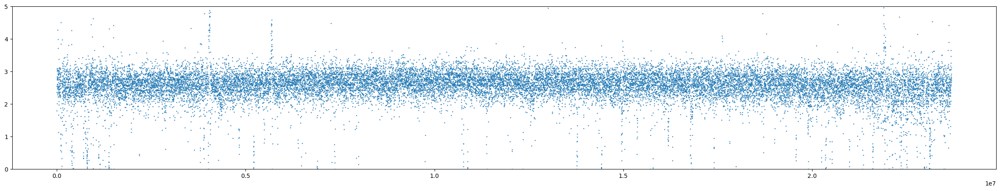

chrIII


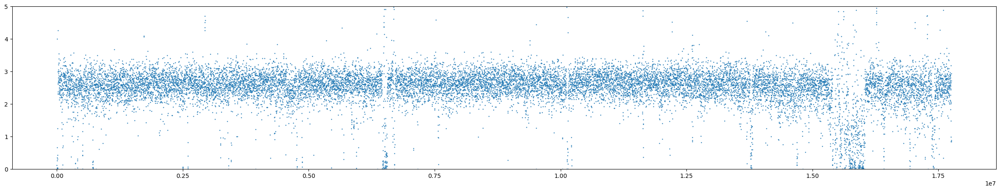

chrIV


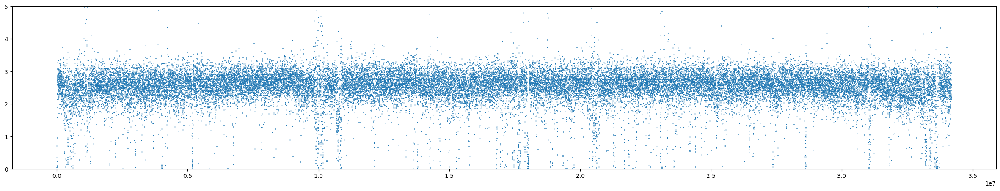

chrIX


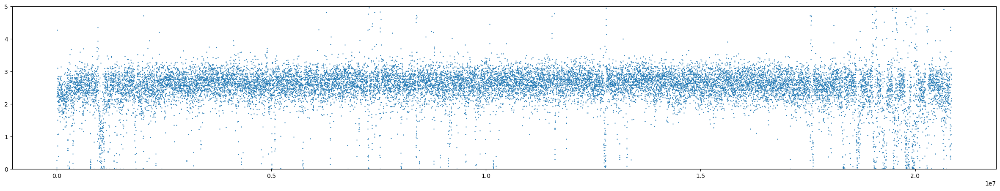

chrM


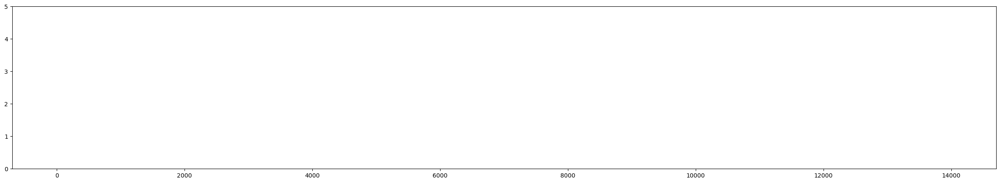

chrUn


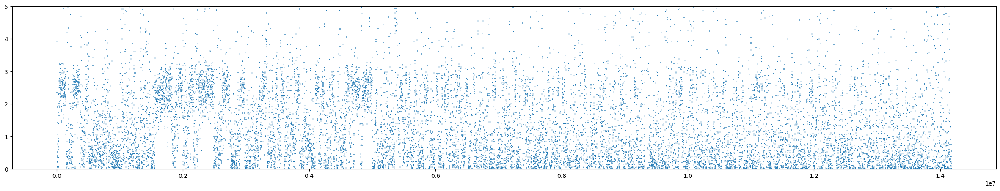

chrV


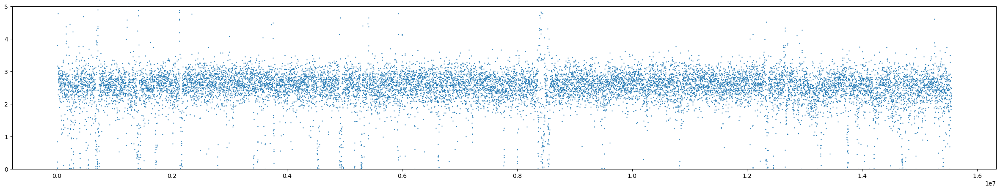

chrVI


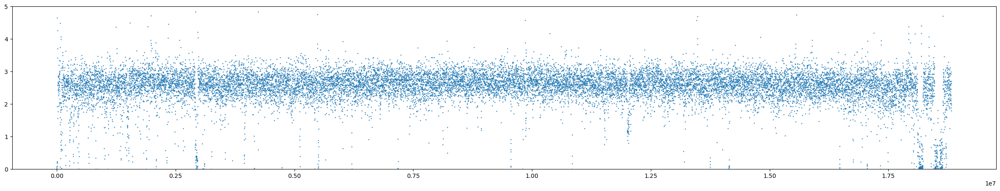

chrVII


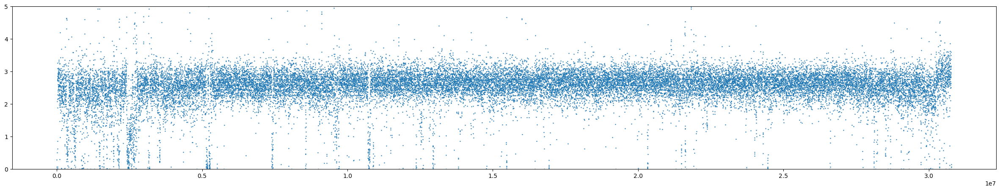

chrVIII


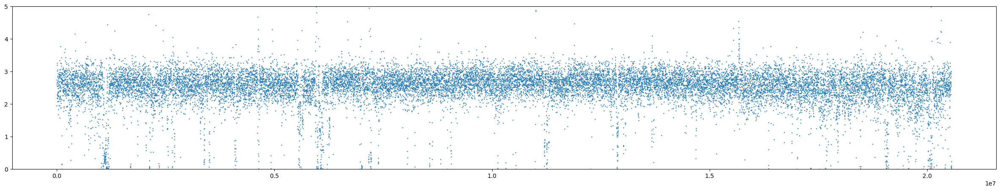

chrX


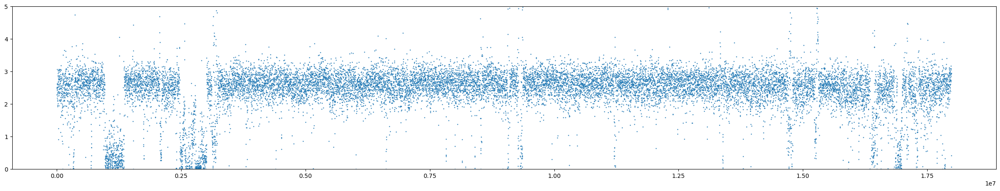

chrXI


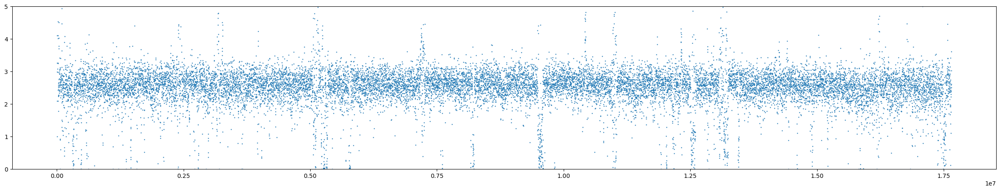

chrXII


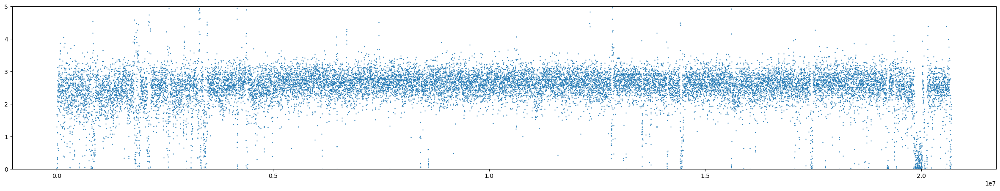

chrXIII


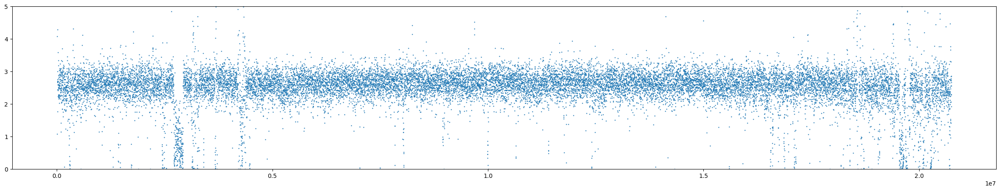

chrXIV


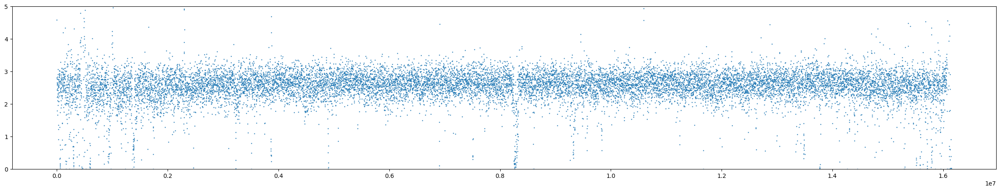

chrXIX


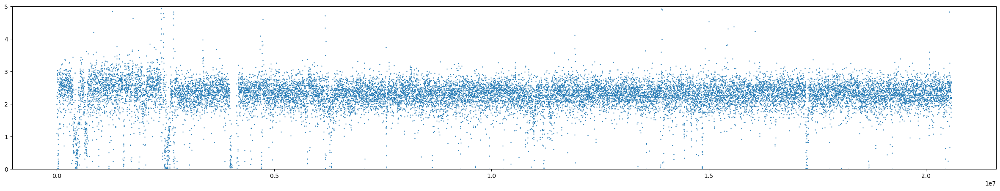

chrXV


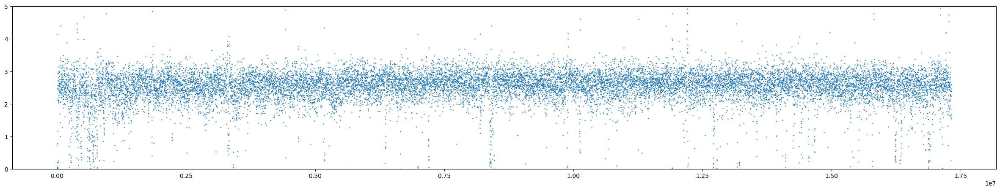

chrXVI


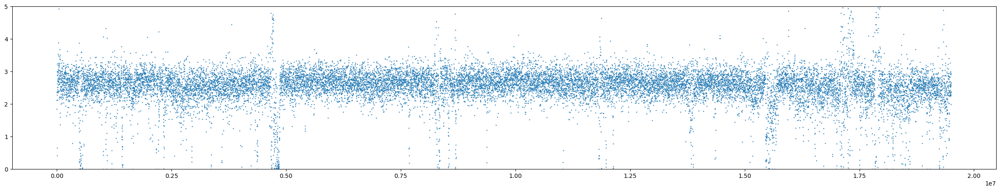

chrXVII


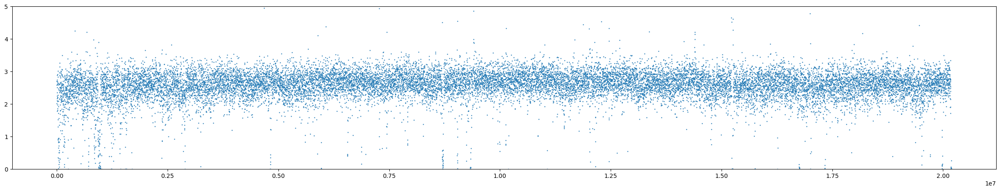

chrXVIII


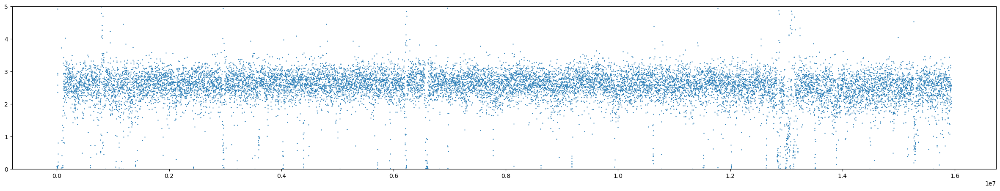

chrXX


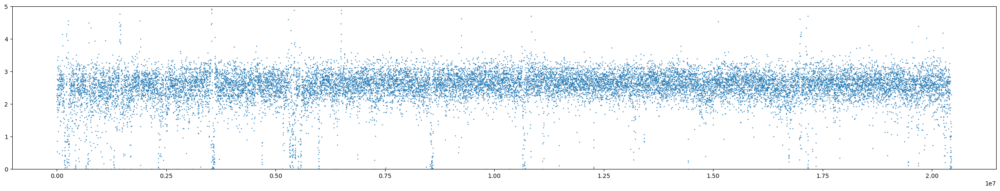

chrXXI


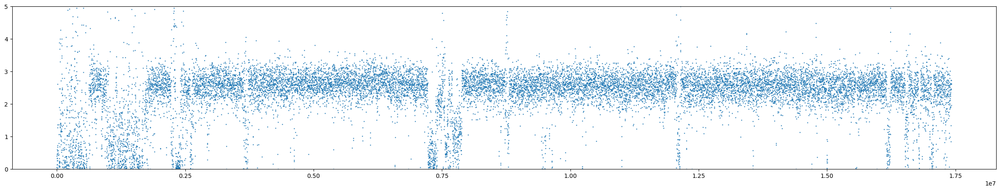

chrY


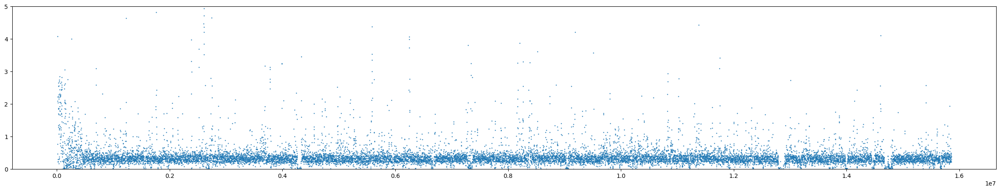

In [8]:
from matplotlib import pyplot as plt

for chrom in chrom_cov_dict:
    
    print(chrom)
    
    plt.figure(figsize = (30,5))
    plt.scatter(chrom_cov_dict[chrom]["start"], chrom_cov_dict[chrom]["RPKM"], s = 0.5)
    plt.ylim(0,5)
    plt.show()
    

In [9]:
with open("/Users/dj20y461/Data_temp/Stickleback/coverage_script/WK_RL_19T_074.1000bp.RPKM.depth") as WK_RL_074:
    
    chrom_cov_dict = {}
    
    for line in WK_RL_074:
        chrom = line.split()[0]
        start = int(line.split()[1])
        RPKM = float(line.split()[3])
        
        if chrom not in chrom_cov_dict:
            chrom_cov_dict[chrom] = {}
            chrom_cov_dict[chrom]["start"] = []
            chrom_cov_dict[chrom]["RPKM"] = []
            
        chrom_cov_dict[chrom]["start"].append(start)
        chrom_cov_dict[chrom]["RPKM"].append(RPKM)
        

chrI


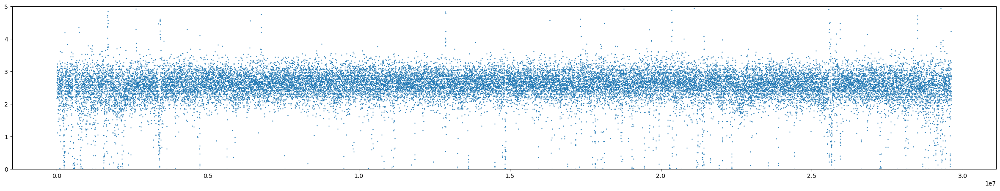

chrII


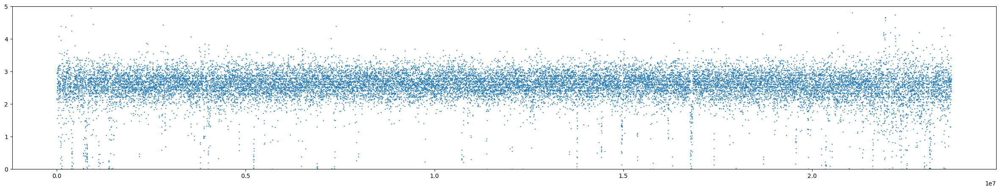

chrIII


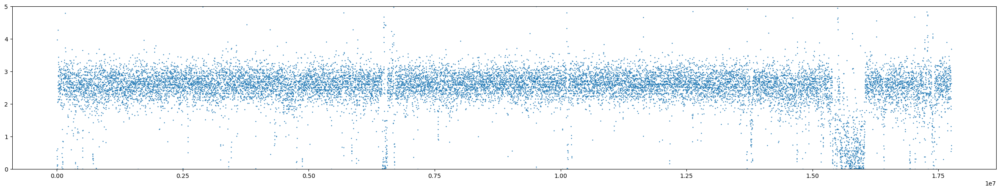

chrIV


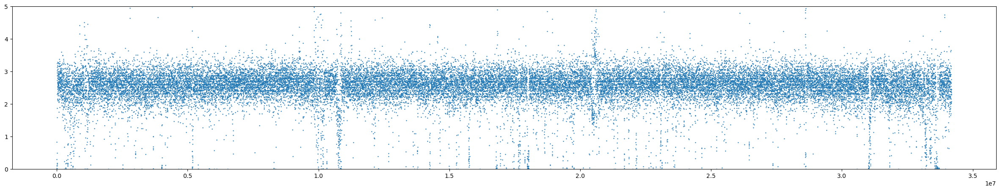

chrIX


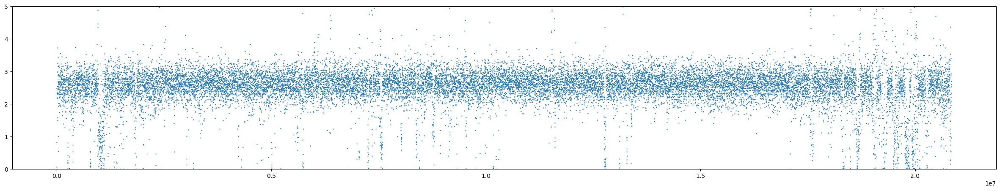

chrM


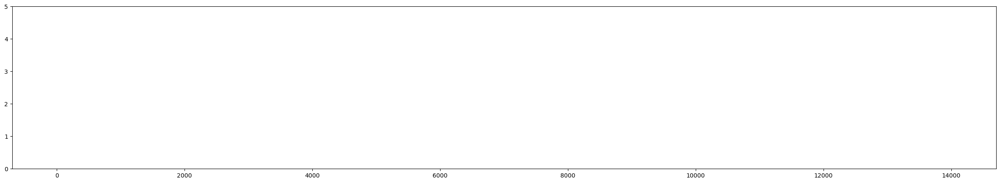

chrUn


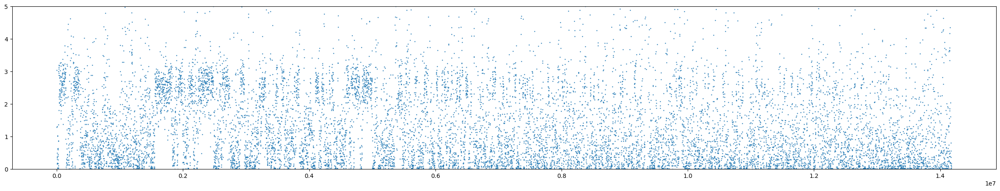

chrV


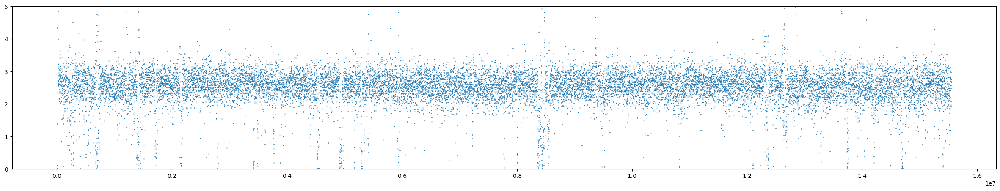

chrVI


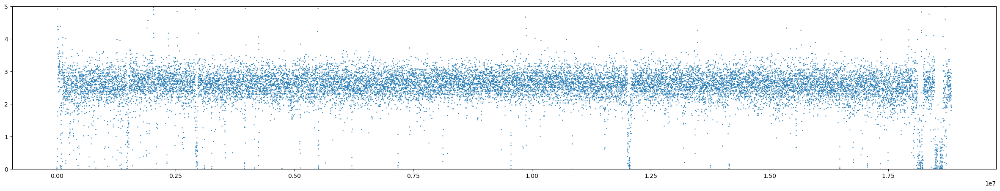

chrVII


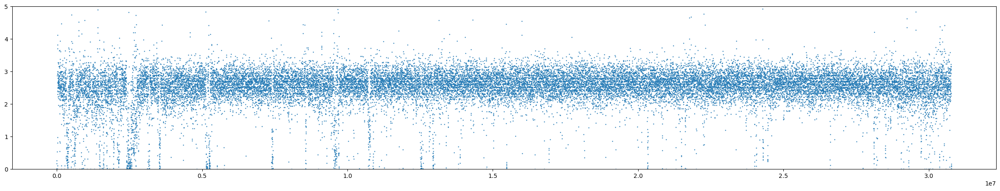

chrVIII


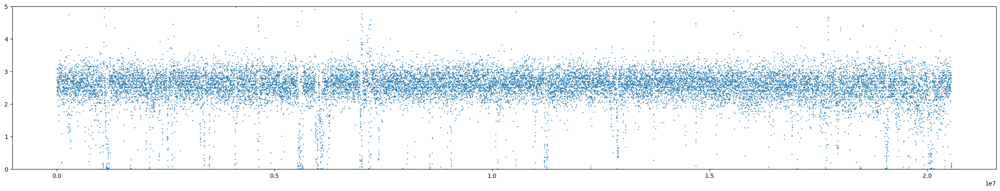

chrX


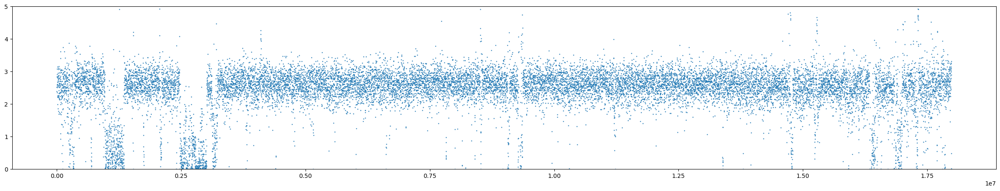

chrXI


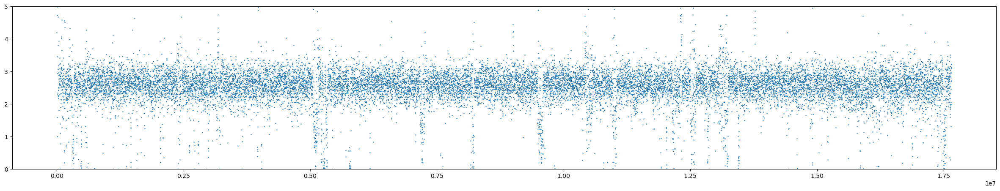

chrXII


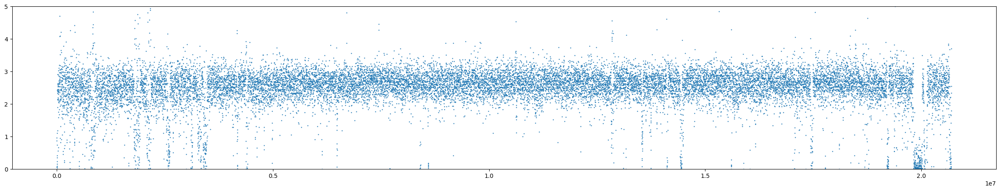

chrXIII


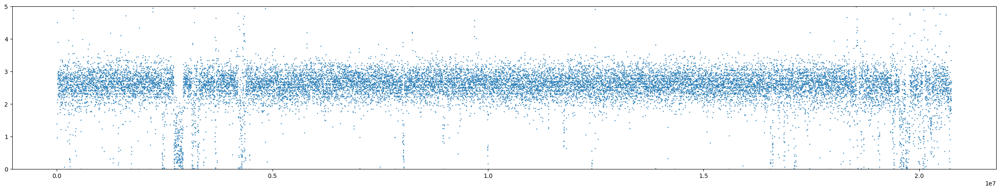

chrXIV


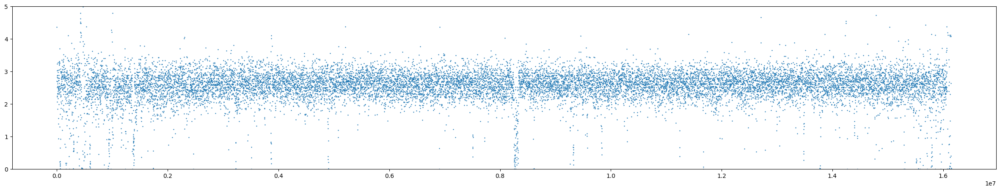

chrXIX


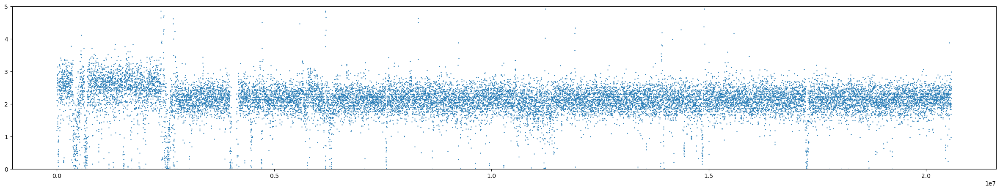

chrXV


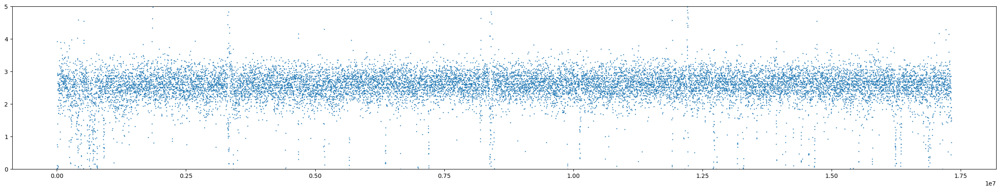

chrXVI


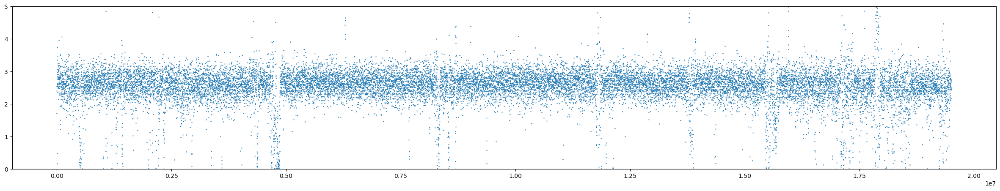

chrXVII


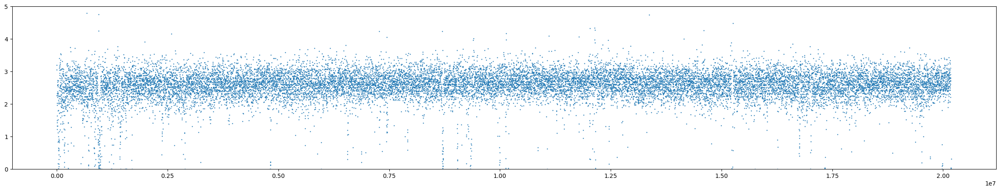

chrXVIII


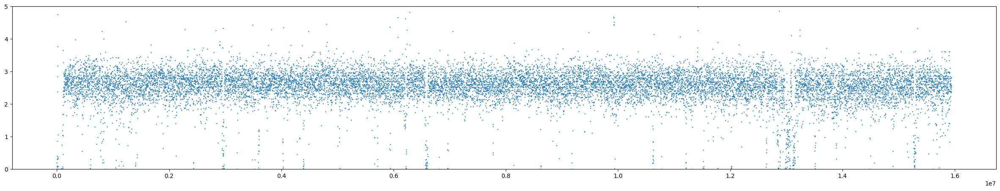

chrXX


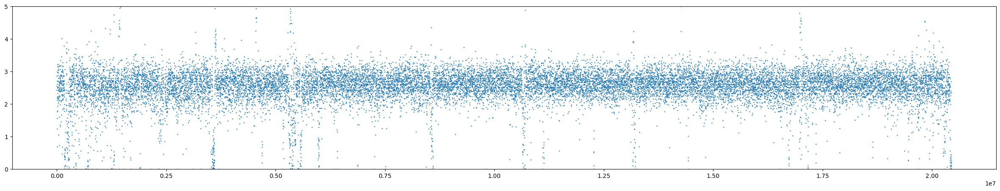

chrXXI


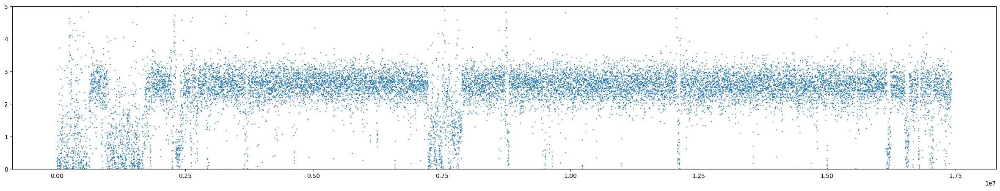

chrY


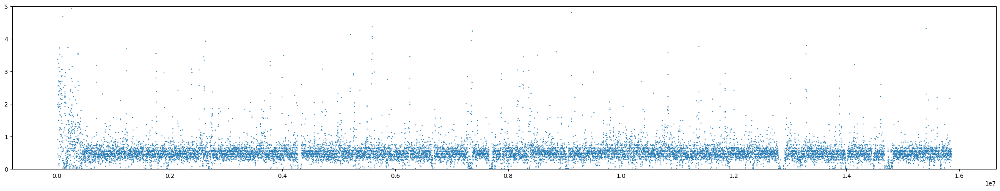

In [10]:
from matplotlib import pyplot as plt

for chrom in chrom_cov_dict:
    
    print(chrom)
    
    plt.figure(figsize = (30,5))
    plt.scatter(chrom_cov_dict[chrom]["start"], chrom_cov_dict[chrom]["RPKM"], s = 0.5)
    plt.ylim(0,5)
    plt.show()
    